## Zespół 3 - Analiza zależności między infrastrukturą komunalną i społeczną, a populacją mieszkańców

W naszym zespole analizowaliśmy zbiór danych zawierających dane na temat stopnia rozwinięcia infrastruktury (m.in. dostęp do sieci wodociągowej, kanalizacyjnej, gazociągowej, liczba dróg utwardzonych i gruntowych), liczby placówek oświatowych i obiektów sportowych, populacji i średnich wynagrodzeń w powiatach na terenie Polski. Zbiór danych utworzyliśmy samodzielnie z wykorzystaniem napisanego przez nas skryptu napisanego w Pythonie (plik "scalanie.py"), który na podstawie plików wyeksportowanych w formacie .csv z udostępnianego przez GUS Banku Danych Lokalnych (https://bdl.stat.gov.pl) utworzył plik "dane.csv", zawierający wszystkie wyeksportowane dane w jednym wspólnym pliku.

Szczegółowy opis danych na podstawie etykiet w zbiorze danych:
 - powiat - nazwa powiatu
 - populacja_ogolem - populacja wszystkich mieszkańców powiatu
 - populacja_produkcyjna - populacja mieszkańców powiatu w wieku produkcyjnym (18-64 dla mezczyzn i 18-59 dla kobiet)
 - stadiony - liczba stadionów w powiecie
 - hale_sportowe - liczba hal sportowych w powiecie
 - sale_gimnastyczne - liczba sal gimnastycznych w powiecie
 - korty_tenisowe - liczba kortów tenisowych w powiecie
 - plywalnie - liczba pływalni w powiecie
 - wodociagi - liczba mieszkańców powiatu posiadających dostęp do sieci wodociągowej
 - drogi_utwardzone_na_obszar - drogi utwardzone na 100 km$^2$ w kilometrach
 - drogi_utwardzone_na_ludnosc - drogi utwardzone na 10 tys. ludności w kilometrach
 - drogi_gruntowe_na_obszar - drogi gruntowe na 100 km$^2$ w kilometrach
 - drogi_gruntowe_na_ludnosc - drogi gruntowe na 10 tys. ludności w kilometrach
 - gaz - liczba mieszkańców powiatu posiadających dostęp do sieci gazowej
 - technika_zawodowki - liczba techników, szkół branżowych, liceów profilowanych i szkół zawodowych w danym powiecie
 - sciezki_rowerowe_na_obszar - ścieżki rowerowe na 10 tys. km$^2$ w kilometrach
 - sciezki_rowerowe_na_ludnosc - ścieżki rowerowe na 10 tys. ludności w kilometrach
 - przystanki_zbiorkom - liczba przystanków komunikacji miejskiej spółek publicznych i prywatnych
 - licea - licea ogólnokształcące w powiecie
 - kanalizacja - liczba mieszkańców powiatu posiadających dostęp do sieci kanalizacyjnej
 - wynagrodzenia - średnie wynagrodzenie w złotówkach
 - odbior_odpadow - wskaźnik usług odbioru odpadów z nieruchomości zamieszkałych w procentach
 - koszty_odpadow - wskaźnik efektywności kosztowej ogółem usług odebranych odpadów komunalnych w złotówkach/tonę
 - szkoly_podstawowe - liczba szkół podstawowych w powiecie

Pracę z danymi rozpoczynamy od importu bibliotek.

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### 1. Analiza stopnia wypełnienia danych

Importujemy utworzony plik z danymi i sprawdzamy jego kompletność.

In [3]:
df = pd.read_csv('dane.csv')
d1 = df.drop(columns='identyfikator')
d1.info()
d1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   powiat                       380 non-null    object 
 1   populacja_ogolem             380 non-null    int64  
 2   populacja_produkcyjna        380 non-null    int64  
 3   stadiony                     380 non-null    int64  
 4   hale_sportowe                380 non-null    int64  
 5   sale_gimnastyczne            380 non-null    int64  
 6   korty_tenisowe               380 non-null    int64  
 7   plywalnie                    380 non-null    int64  
 8   wodociagi                    380 non-null    int64  
 9   drogi_utwardzone_na_obszar   380 non-null    float64
 10  drogi_utwardzone_na_ludnosc  380 non-null    float64
 11  drogi_gruntowe_na_obszar     380 non-null    float64
 12  drogi_gruntowe_na_ludnosc    380 non-null    float64
 13  gaz                 

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,...,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
0,Powiat bolesławiecki,89762,53992,23,1,0,3,2,88295,48.0,...,25,437.3,6.35,422,5,74908,4887.95,0.0,0.00,35
1,Powiat dzierżoniowski,99935,58574,6,4,3,16,1,93979,101.8,...,27,1222.5,5.85,368,4,72342,4690.20,0.0,0.00,29
2,Powiat głogowski,88447,51709,3,2,0,5,2,86669,94.7,...,26,550.5,2.76,356,6,78723,4763.21,0.0,0.00,26
3,Powiat górowski,34552,20946,3,2,1,2,1,33674,69.1,...,23,63.7,1.36,226,2,15251,4432.40,0.0,0.00,14
4,Powiat jaworski,49734,29740,2,0,0,1,1,45049,78.7,...,26,180.6,2.11,224,1,39901,4932.98,0.0,0.00,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,Powiat wałecki,52707,31905,6,3,5,7,1,51311,24.9,...,17,127.2,3.42,274,2,40121,4678.73,0.0,0.00,19
376,Powiat łobeski,36486,21861,3,2,0,8,0,35250,39.1,...,22,15.0,0.44,173,2,24255,4713.45,0.0,0.00,13
377,Powiat m.Koszalin,106235,59752,3,7,3,13,2,106201,173.7,...,22,8958.7,8.29,323,7,100431,4973.23,76.2,524.56,23
378,Powiat m.Szczecin,398255,229608,4,7,10,11,3,381477,224.0,...,24,4943.4,3.73,1238,27,344066,5695.84,76.5,717.60,90


Dane są kompletne - każdy z 380 powiatów posiada pełen komplet danych na swój temat (Not-Null Count wynosi 380 dla każdej cechy).

### 2. Analiza zakresów i stopnia zmienności danych

Sprawdzamy zakresy i zmienność posiadanych cech w zestawie danych.

In [8]:
cechy = d1.columns.values
pd.set_option('display.max_columns', 24)
d1[cechy].describe().T

,count,mean,std,min,25%,50%,75%,max
populacja_ogolem,380.0,100697.402632,119925.876590,19689.00,54676.0000,75702.500,110980.5000,1794166.00
populacja_produkcyjna,380.0,59924.842105,68713.163564,12011.00,32628.7500,45585.000,66929.2500,1020307.00
stadiony,380.0,6.231579,5.003856,0.00,3.0000,5.000,8.0000,42.00
hale_sportowe,380.0,2.807895,3.603347,0.00,1.0000,2.000,4.0000,41.00
sale_gimnastyczne,380.0,3.128947,5.511006,0.00,0.0000,2.000,4.0000,60.00
korty_tenisowe,380.0,5.952632,9.844054,0.00,1.0000,3.000,7.0000,94.00
plywalnie,380.0,1.523684,2.892437,0.00,0.0000,1.000,2.0000,47.00
wodociagi,380.0,92890.968421,116037.913889,15239.00,49033.0000,68147.000,103452.0000,1725657.00
drogi_utwardzone_na_obszar,380.0,123.699474,91.801376,21.80,65.5750,91.100,137.2000,502.60
drogi_utwardzone_na_ludnosc,380.0,90.369737,50.991029,10.70,56.4250,87.900,119.0250,331.60


### 3. Analiza zależności między danymi

Do analizy zależności między danymi wykorzystaliśmy wykres mapy cieplnej ze skalą stanowiącą 

<AxesSubplot:>

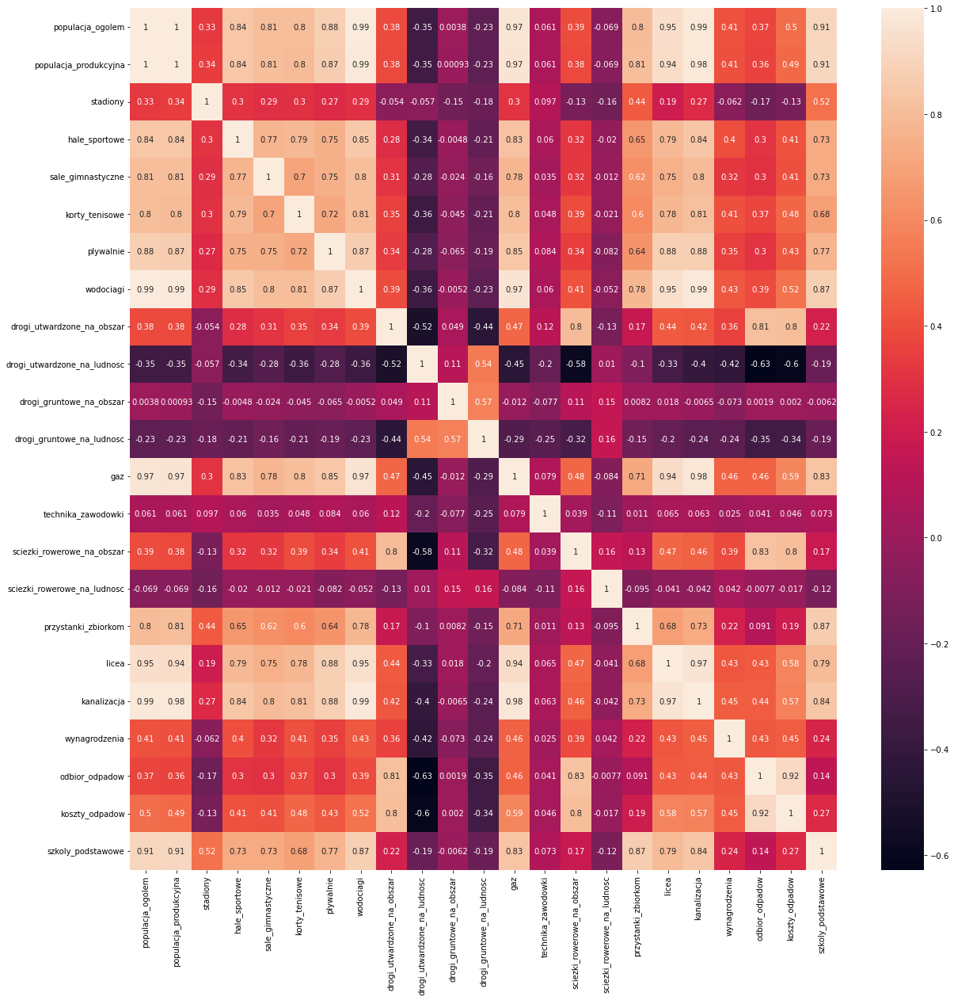

In [5]:
plt.figure(figsize=(20,20))
sns.heatmap(d1.corr(),annot = d1.corr())

In [6]:
d1.sort_values(by=['wynagrodzenia']).tail(n=10)

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
62,Powiat łęczyński,57218,35305,2,3,1,1,0,55664,103.1,114.7,76.6,85.3,25856,20,519.9,5.78,326,4,31735,6391.65,0.0,0.00,27
134,Powiat m.Kraków,779966,457125,18,26,37,75,16,777973,300.7,12.6,19.8,0.8,545237,25,7734.4,3.24,1843,65,719512,6482.24,95.3,637.09,202
249,Powiat m.Gdańsk,470805,270425,9,17,36,43,9,470805,282.3,15.7,26.9,1.5,350725,23,7749.3,4.31,1208,34,454551,6490.53,64.8,920.94,109
278,Powiat m.Katowice,290553,168371,2,8,17,21,6,286166,296.1,16.8,17.7,1.0,221529,21,5624.4,3.19,725,21,277658,6525.94,74.3,489.90,81
175,Powiat m.Płock,118268,68107,2,3,3,4,3,114006,240.2,17.9,17.4,1.3,72124,22,7269.4,5.41,386,13,107131,6526.04,86.6,804.64,27
252,Powiat m.Sopot,35286,19256,5,1,1,56,3,35276,330.4,16.2,11.6,0.6,28958,21,12905.1,6.32,101,5,35275,6529.10,78.1,926.62,12
91,Powiat bełchatowski,112443,68039,9,4,3,11,3,106566,90.6,78.0,33.0,28.4,48696,25,1415.9,12.18,730,8,75393,7002.62,0.0,0.00,38
178,Powiat m. st. Warszawa,1794166,1020307,18,41,60,94,47,1725657,423.3,12.2,31.8,0.9,1297701,24,13071.3,3.77,4196,174,1701091,7147.46,91.1,1776.41,408
276,Powiat m.Jastrzębie-Zdrój,88038,52282,1,3,3,1,1,87959,292.7,28.4,21.9,2.1,72937,22,3468.9,3.36,201,7,76658,8377.01,98.3,506.89,23
10,Powiat lubiński,105896,61295,4,4,1,11,2,105813,61.6,41.4,4.7,3.1,87046,23,626.7,4.21,346,5,100862,8920.41,0.0,0.00,25


### 4. Wizualizacja danych

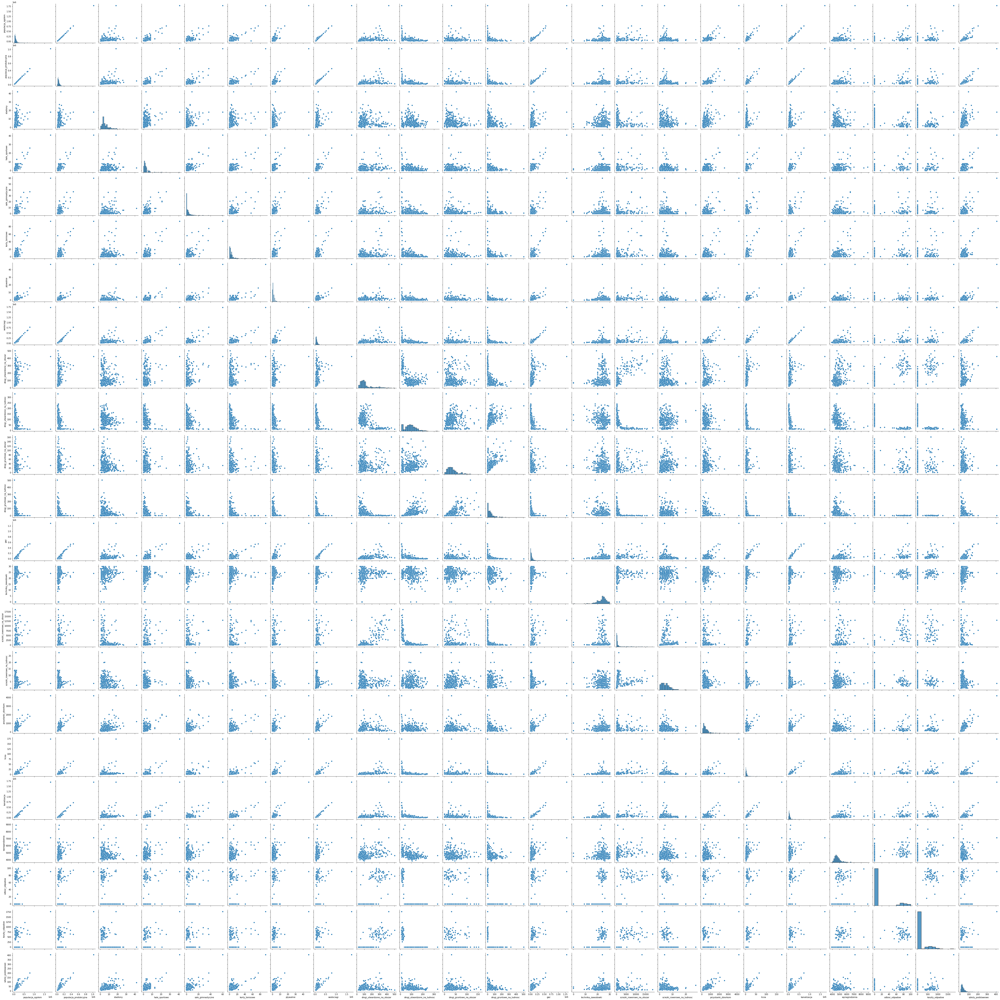

In [7]:
sns.pairplot(d1, kind="scatter", height=3)
plt.show()

In [8]:
d1.loc[df['powiat'] == "Powiat m. st. Warszawa"]

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
178,Powiat m. st. Warszawa,1794166,1020307,18,41,60,94,47,1725657,423.3,12.2,31.8,0.9,1297701,24,13071.3,3.77,4196,174,1701091,7147.46,91.1,1776.41,408


In [9]:
d2 = d1[d1.populacja_ogolem != 1794166]
d2

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
0,Powiat bolesławiecki,89762,53992,23,1,0,3,2,88295,48.0,69.7,6.5,9.4,45587,25,437.3,6.35,422,5,74908,4887.95,0.0,0.00,35
1,Powiat dzierżoniowski,99935,58574,6,4,3,16,1,93979,101.8,48.7,37.4,17.9,78893,27,1222.5,5.85,368,4,72342,4690.20,0.0,0.00,29
2,Powiat głogowski,88447,51709,3,2,0,5,2,86669,94.7,47.4,24.3,12.2,64061,26,550.5,2.76,356,6,78723,4763.21,0.0,0.00,26
3,Powiat górowski,34552,20946,3,2,1,2,1,33674,69.1,147.6,24.2,51.7,13964,23,63.7,1.36,226,2,15251,4432.40,0.0,0.00,14
4,Powiat jaworski,49734,29740,2,0,0,1,1,45049,78.7,92.0,16.7,19.6,27896,26,180.6,2.11,224,1,39901,4932.98,0.0,0.00,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,Powiat wałecki,52707,31905,6,3,5,7,1,51311,24.9,66.8,40.0,107.3,25761,17,127.2,3.42,274,2,40121,4678.73,0.0,0.00,19
376,Powiat łobeski,36486,21861,3,2,0,8,0,35250,39.1,114.1,24.6,71.9,12467,22,15.0,0.44,173,2,24255,4713.45,0.0,0.00,13
377,Powiat m.Koszalin,106235,59752,3,7,3,13,2,106201,173.7,16.1,29.8,2.8,90977,22,8958.7,8.29,323,7,100431,4973.23,76.2,524.56,23
378,Powiat m.Szczecin,398255,229608,4,7,10,11,3,381477,224.0,16.9,17.7,1.3,330711,24,4943.4,3.73,1238,27,344066,5695.84,76.5,717.60,90


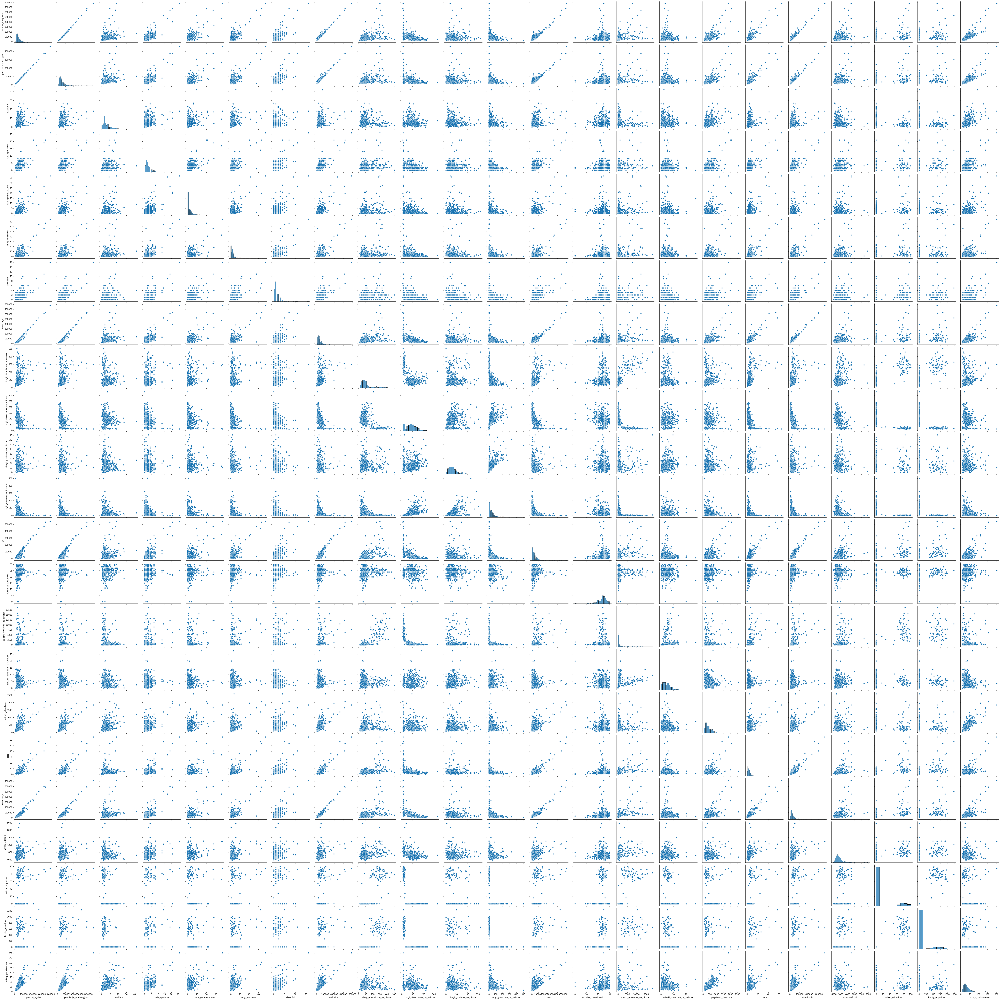

In [10]:
sns.pairplot(d2, kind="scatter", height=3)
plt.show()

In [11]:
d_miasta = d1[d1['powiat'].str.contains('Powiat m\\.')]
d_miasta

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
26,Powiat m.Jelenia Góra,78335,43799,4,3,2,9,2,76336,187.2,26.1,8.1,1.1,72675,23,5228.0,7.29,242,4,70395,5183.33,72.9,945.00,15
27,Powiat m.Legnica,98436,57335,4,3,1,3,2,96811,359.0,20.5,91.0,5.2,92099,25,7052.8,4.03,228,9,92233,4952.32,88.2,615.14,20
28,Powiat m.Wrocław,641928,372138,17,19,27,56,11,619234,311.8,14.2,29.5,1.3,467799,22,12307.9,5.61,1640,41,594770,6140.64,92.2,659.20,137
29,Powiat m.Wałbrzych od 2013,109971,63204,7,5,0,1,1,107140,194.5,15.0,5.5,0.4,104251,24,3978.7,3.06,299,6,90521,5565.38,81.0,503.85,24
49,Powiat m.Bydgoszcz,344091,197958,11,4,17,32,3,333817,293.2,15.0,108.8,5.6,274493,24,6557.6,3.35,983,24,320785,5252.17,77.5,715.96,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357,Powiat m.Leszno,62854,36267,4,3,2,4,1,61938,459.5,23.3,161.3,8.2,48328,24,18644.1,9.45,191,6,61590,4824.14,83.2,655.36,16
358,Powiat m.Poznań,532048,306055,13,14,9,64,5,523132,329.5,16.2,49.3,2.4,442102,25,10538.0,5.19,1378,57,504862,6104.97,79.2,1233.99,140
377,Powiat m.Koszalin,106235,59752,3,7,3,13,2,106201,173.7,16.1,29.8,2.8,90977,22,8958.7,8.29,323,7,100431,4973.23,76.2,524.56,23
378,Powiat m.Szczecin,398255,229608,4,7,10,11,3,381477,224.0,16.9,17.7,1.3,330711,24,4943.4,3.73,1238,27,344066,5695.84,76.5,717.60,90


In [12]:
d_ziemskie = pd.concat([d1, d_miasta]).drop_duplicates(keep=False)
d_ziemskie

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
0,Powiat bolesławiecki,89762,53992,23,1,0,3,2,88295,48.0,69.7,6.5,9.4,45587,25,437.3,6.35,422,5,74908,4887.95,0.0,0.0,35
1,Powiat dzierżoniowski,99935,58574,6,4,3,16,1,93979,101.8,48.7,37.4,17.9,78893,27,1222.5,5.85,368,4,72342,4690.20,0.0,0.0,29
2,Powiat głogowski,88447,51709,3,2,0,5,2,86669,94.7,47.4,24.3,12.2,64061,26,550.5,2.76,356,6,78723,4763.21,0.0,0.0,26
3,Powiat górowski,34552,20946,3,2,1,2,1,33674,69.1,147.6,24.2,51.7,13964,23,63.7,1.36,226,2,15251,4432.40,0.0,0.0,14
4,Powiat jaworski,49734,29740,2,0,0,1,1,45049,78.7,92.0,16.7,19.6,27896,26,180.6,2.11,224,1,39901,4932.98,0.0,0.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,Powiat stargardzki,120132,71983,10,4,0,5,1,116841,47.2,59.7,12.2,15.4,71455,24,527.7,6.68,602,5,98640,4750.37,0.0,0.0,39
373,Powiat szczecinecki,77258,46236,5,5,7,15,0,76034,40.3,92.0,13.2,30.2,38017,25,220.3,5.04,329,8,65459,4827.82,0.0,0.0,27
374,Powiat świdwiński,46394,28048,4,3,2,4,2,43732,42.9,101.1,30.6,72.1,20466,30,337.6,7.95,165,2,38335,4339.70,0.0,0.0,18
375,Powiat wałecki,52707,31905,6,3,5,7,1,51311,24.9,66.8,40.0,107.3,25761,17,127.2,3.42,274,2,40121,4678.73,0.0,0.0,19


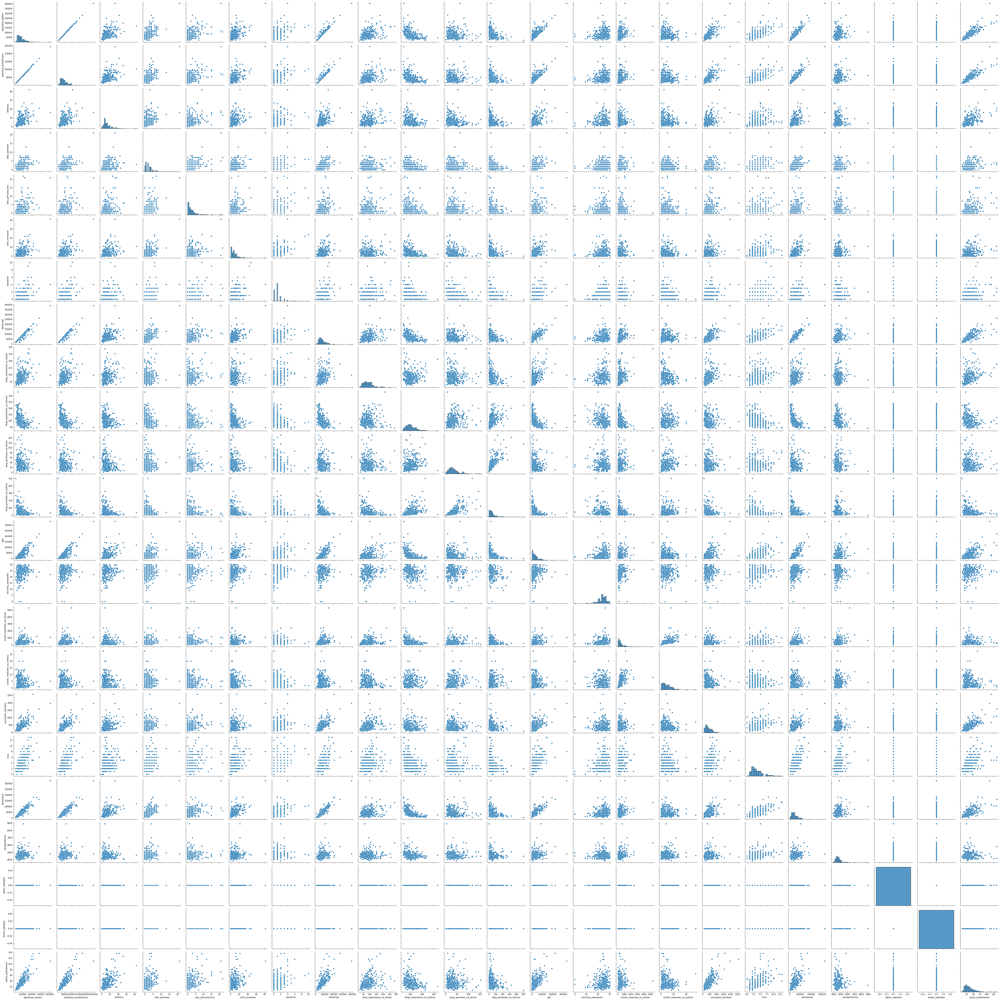

In [13]:
sns.pairplot(d_ziemskie, kind="scatter", height=3)
plt.show()

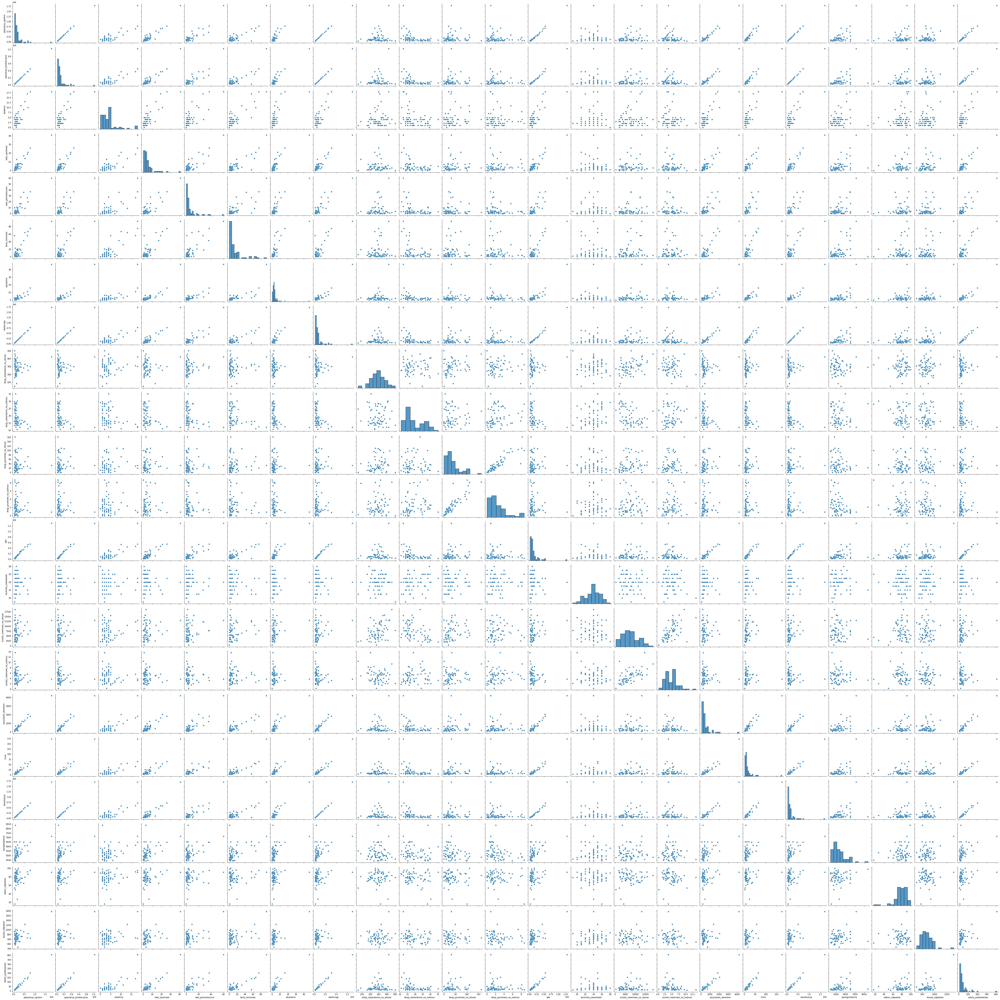

In [14]:
sns.pairplot(d_miasta, kind="scatter", height=3)
plt.show()

In [15]:
d_miasta.sort_values(by='wynagrodzenia', ascending=False)

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
276,Powiat m.Jastrzębie-Zdrój,88038,52282,1,3,3,1,1,87959,292.7,28.4,21.9,2.1,72937,22,3468.9,3.36,201,7,76658,8377.01,98.3,506.89,23
178,Powiat m. st. Warszawa,1794166,1020307,18,41,60,94,47,1725657,423.3,12.2,31.8,0.9,1297701,24,13071.3,3.77,4196,174,1701091,7147.46,91.1,1776.41,408
252,Powiat m.Sopot,35286,19256,5,1,1,56,3,35276,330.4,16.2,11.6,0.6,28958,21,12905.1,6.32,101,5,35275,6529.10,78.1,926.62,12
175,Powiat m.Płock,118268,68107,2,3,3,4,3,114006,240.2,17.9,17.4,1.3,72124,22,7269.4,5.41,386,13,107131,6526.04,86.6,804.64,27
278,Powiat m.Katowice,290553,168371,2,8,17,21,6,286166,296.1,16.8,17.7,1.0,221529,21,5624.4,3.19,725,21,277658,6525.94,74.3,489.90,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,Powiat m.Biała Podlaska,56942,34094,2,0,0,1,0,49520,323.9,28.1,100.0,8.7,28208,26,4251.0,3.69,196,7,49100,4504.47,16.2,438.03,12
135,Powiat m.Nowy Sącz,83558,49324,6,5,4,14,2,72229,381.7,26.3,47.9,3.3,75897,26,2935.0,2.02,713,12,72231,4468.93,75.2,460.98,22
212,Powiat m.Krosno,45944,26467,2,1,10,8,2,43455,301.1,28.5,20.7,2.0,43324,26,5172.4,4.90,258,7,41672,4424.93,70.9,646.25,14
113,Powiat m.Piotrków Trybunalski,72250,41421,2,1,1,11,3,69870,285.4,26.6,28.6,2.7,54918,23,4312.9,4.01,266,7,65672,4422.85,89.6,459.27,21


In [16]:
d_ziemskie.sort_values(by='wodociagi', ascending=False)

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,drogi_utwardzone_na_ludnosc,drogi_gruntowe_na_obszar,drogi_gruntowe_na_ludnosc,gaz,technika_zawodowki,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
344,Powiat poznański,406590,244857,16,21,21,41,4,390800,97.2,45.4,62.3,29.1,332688,22,1082.2,5.06,1960,8,326036,4776.27,0.0,0.0,110
120,Powiat krakowski,281440,170468,21,4,3,6,3,263445,177.5,77.6,9.6,4.2,222310,24,204.0,0.89,1593,6,163526,5788.98,0.0,0.0,137
247,Powiat wejherowski,219457,132014,12,5,2,14,1,207516,68.0,39.8,36.4,21.3,107302,26,570.3,3.34,938,8,181964,4620.89,0.0,0.0,66
292,Powiat kielecki,210992,131651,14,3,6,7,4,202694,88.4,94.1,15.9,16.9,22902,24,403.4,4.29,2578,5,113995,4355.66,0.0,0.0,116
169,Powiat wołomiński,252408,151286,6,5,5,7,2,195470,115.4,43.6,79.3,30.0,192353,20,1195.5,4.52,700,11,177509,4997.04,0.0,0.0,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,Powiat węgorzewski,22444,13541,2,3,7,2,0,21995,39.4,121.8,35.1,108.4,12162,24,442.9,13.68,128,1,13402,4314.62,0.0,0.0,9
211,Powiat leski,26375,16228,2,1,2,3,3,16234,28.6,90.7,1.6,5.0,6636,20,2.4,0.08,180,1,13812,4832.85,0.0,0.0,18
192,Powiat brzozowski,65373,39965,18,0,0,2,1,15544,85.7,70.7,17.4,14.3,51804,24,148.3,1.22,329,2,38266,4206.54,0.0,0.0,41
191,Powiat bieszczadzki,21489,13485,2,1,0,6,2,15339,21.8,115.4,51.2,271.2,285,20,0.0,0.00,168,1,10444,4445.97,0.0,0.0,11
